In [1]:
#이미지 시각화 준비

import os
from glob import glob
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
def read_image(path):
    # OpenCV는 이미지 데이터를 B(lue), G(reen), R(ed) 순서로 읽어오기 때문에,
    # cv2.cvtColor() 함수를 통해 R(ed), G(reen), B(lue) 순서로 변경한다.
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

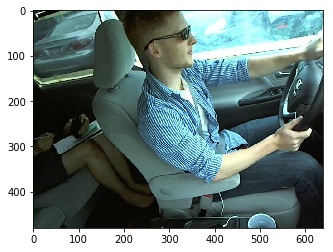

In [3]:
# 클래스 c0의 예시 이미지를 시각화 하는 코드
# 이미지 파일 경로를 지정한다
data_dir = 'C:/Users/juhee/.kaggle/competitions/state-farm-distracted-driver-detection/imgs/'
train_path = data_dir + 'train/c0/'
test_path = data_dir + 'test/'
filename = 'img_100026.jpg'

# 이미지 데이터 읽어오기
image = read_image(train_path + filename)

# 이미지 시각화
plt.imshow(image)




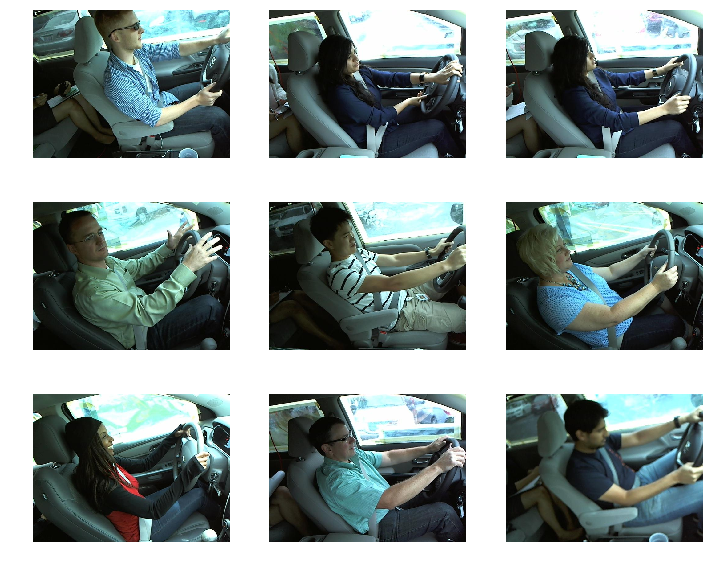

				# c0 : 안전운전


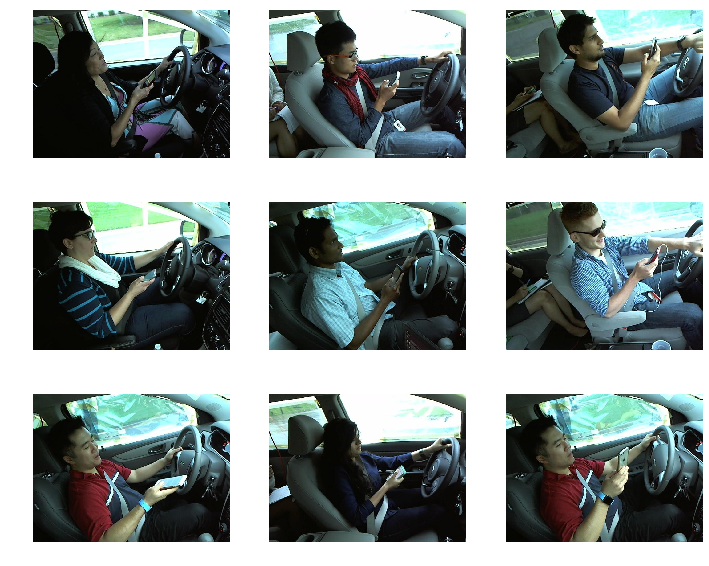

				# c1 : 오른손으로 문자


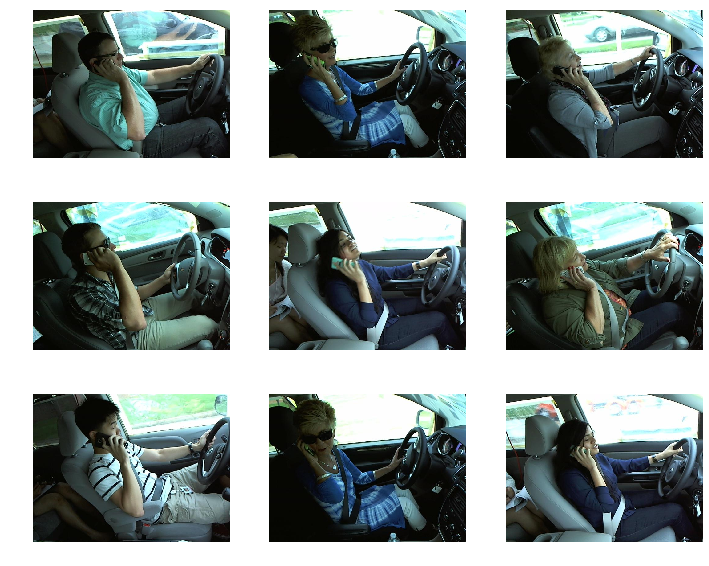

				# c2 : 오른손으로 전화


KeyboardInterrupt: 

In [4]:
labels=['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
col_to_kor={
    'c0':'안전운전',
    'c1':'오른손으로 문자',
    'c2':'오른손으로 전화',
    'c3':'왼손으로 문자',
    'c4':'왼손으로 전화',
    'c5':'라디오 조작',
    'c6':'음료수 섭취',
    'c7':'뒷자석에 손뻗기',
    'c8':'얼굴, 머리 만지기',
    'c9':'조수석과 대화',

}

for label in labels:
    f, ax = plt.subplots(figsize=(12, 10))
    files = glob('{}/train/{}/*.jpg'.format(data_dir, label))
    
    # 총 9개의 이미지를 시각화한다
    for x in range(9):
        plt.subplot(3, 3, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')
    plt.show()
    print('\t\t\t\t# {} : {}'.format(label, col_to_kor[label]))


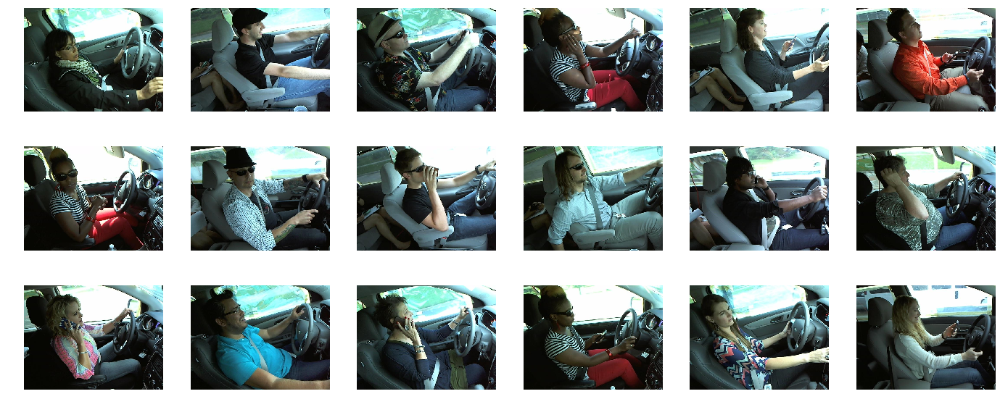

In [5]:
#test이미지 시각화 하기
f,ax=plt.subplots(figsize=(24,10))
files=glob('{}/test/*.jpg'.format(data_dir))

for x in range(18):
    plt.subplot(3,6,x+1)
    image=read_image(files[x])
    plt.imshow(image)
    plt.axis('off')

In [6]:
#운전자 정보가 담겨진 파일(diver_igms_list.csv)를 읽어오기
import pandas as pd

driver_list=pd.read_csv('C://Users//juhee//.kaggle//competitions/state-farm-distracted-driver-detection//driver_imgs_list.csv')
driver_list.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [7]:
#운전자 ID 고유값의 개수를 구하기
import numpy as np

#운전자 ID고유값의 개수를 출력한다
len(np.unique(driver_list['subject']).tolist())



26

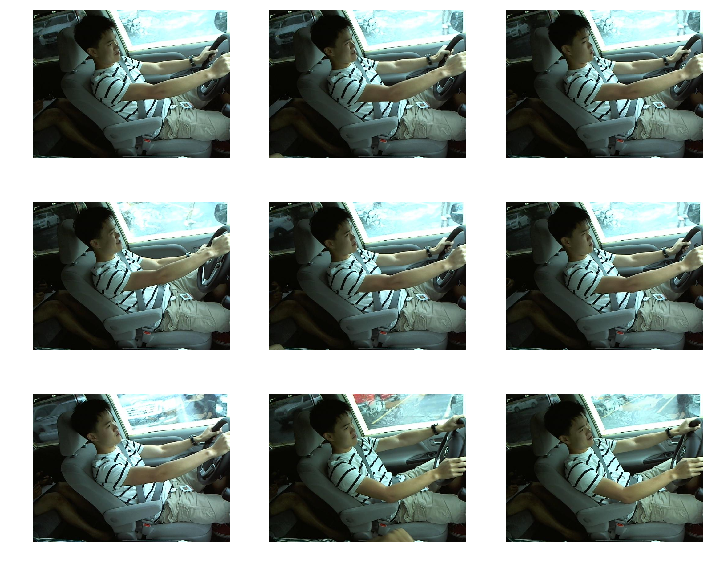

				#운전자: p002 | 클래스:"c0:안전운전"


KeyboardInterrupt: 

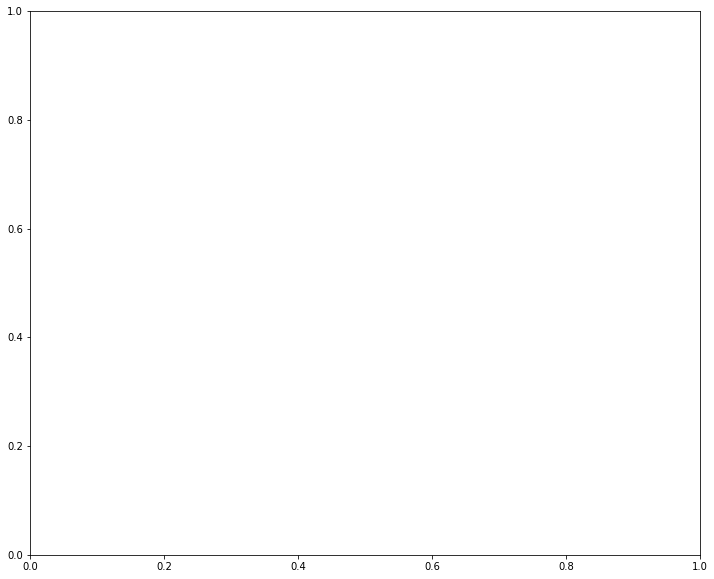

In [8]:
#운전자별 이미지 데이터를 저장하는 dict를 생성한다.

driver_to_img={}
for i,row in driver_list.iterrows():
    driver=row['subject']
    label=row['classname']
    image_path=row['img']
    if not driver_to_img.get(driver,False):
        driver_to_img[driver]=[image_path]
    else:
        driver_to_img.get(driver).append(image_path)
        
for driver in np.unique(driver_list['subject']).tolist():
    for label in labels:
        f,ax=plt.subplots(figsize=(12,10))
        files=glob('{}/train/{}/*.jpg'.format(data_dir,label))
        print_files=[]
        for fl in files:
            if (driver_list[driver_list['img']== os.path.basename(fl)]
               ['subject']==driver).values[0]:
                    print_files.append(fl)
                    
        for x in range(9):
            plt.subplot(3,3,x+1)
            image=read_image(print_files[x])
            plt.imshow(image)
            plt.axis('off')
        plt.show()
        
        print('\t\t\t\t#운전자: {} | 클래스:"{}:{}"'.format(driver,label,col_to_kor[label]))
            

#"c0: 안전 운전"Outliers


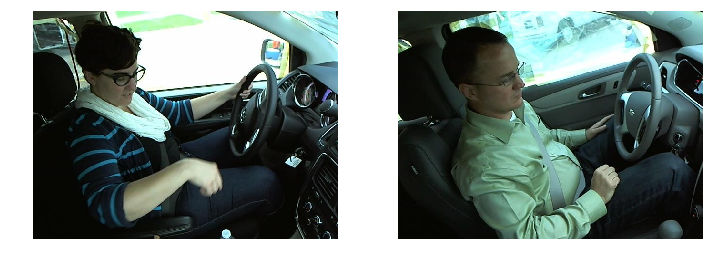

In [9]:
#훈련데이터:클래스 c0에 속하는 특이한 훈련 데이터(Outliers)를 시각화 하기

#Label:c0 안전운전
label='c0'
imgs=[21155,31121]

print('#"c0: 안전 운전"Outliers')

f,ax=plt.subplots(figsize=(12,10))
for x in range(len(imgs)):
    plt.subplot(1,2,x+1)
    image=read_image('{}train/{}/img_{}.jpg'.format(data_dir,label,imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# "c3: 왼손으로 문자" Outliers


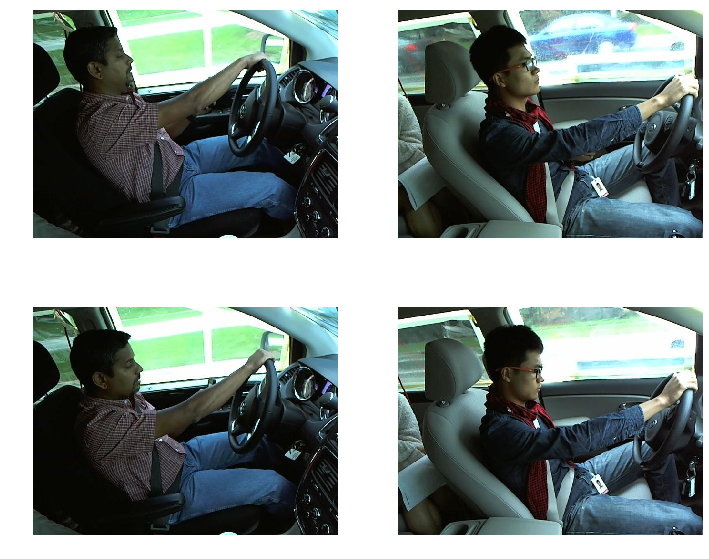

In [10]:
#클래스 c3에 속하는 특이한 훈련 데이타(Outliers)를 시각화 하기
#Label:c3 왼손으로 문자
# Label : c3 왼손으로 문자
label = 'c3'
imgs = [38563, 45874, 49269, 62784]
print('# "c3: 왼손으로 문자" Outliers')
f, ax = plt.subplots(figsize=(12, 10))
for x in range(len(imgs)):
    plt.subplot(2, 2, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()


# "c4: 왼손으로 전화" Outliers


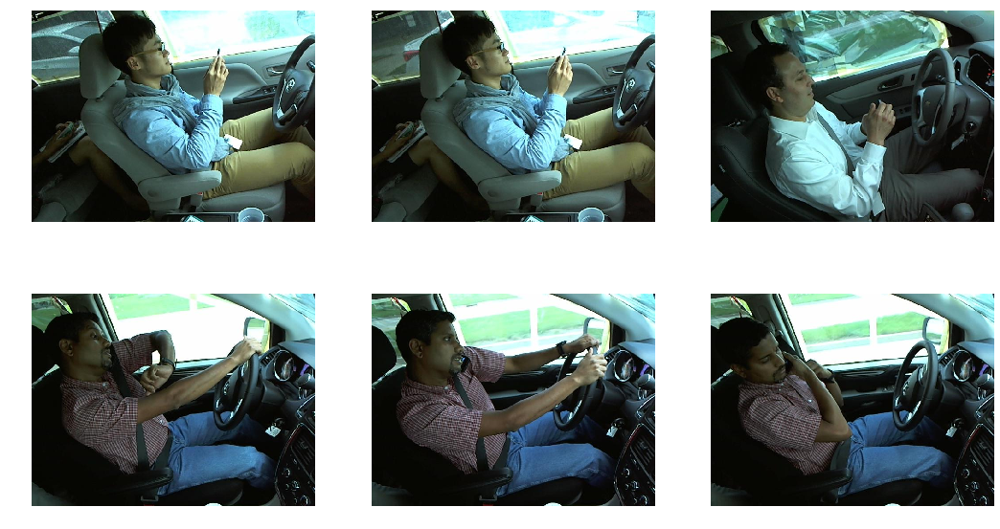

In [11]:
#클래스 c4에 속하는 특이한 훈련 데이타(Outliers)를 시각화 하기
#Label:c4 왼손으로 전화
# Label : c4 왼손으로 전화
label = 'c4'
imgs = [92769, 38427, 41743, 69998, 77347, 16077]
print('# "c4: 왼손으로 전화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(2, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()


#"c9: 조수석과대화 "Outliers


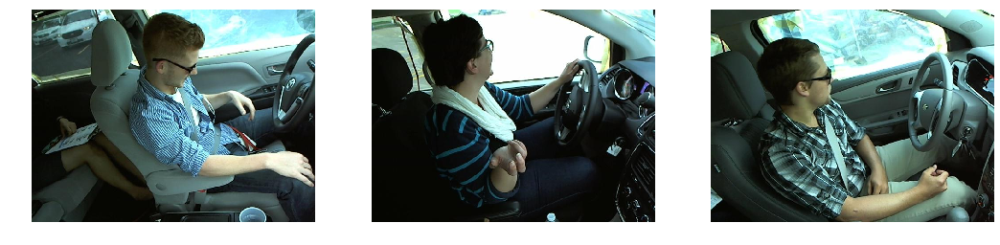

In [12]:
#클래스 c9에 속하는 특이한 훈련 데이타(Outliers)를 시각화 하기
#Label:c9 조수석과대화
label='c9'
imgs=[28068,37708,73663]

print('#"c9: 조수석과대화 "Outliers')

f,ax=plt.subplots(figsize=(18,10))
for x in range(len(imgs)):
    plt.subplot(2,3,x+1)
    image=read_image('{}train/{}/img_{}.jpg'.format(data_dir,label,imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Examples of c0 : 안전운전 classified in wrong labels


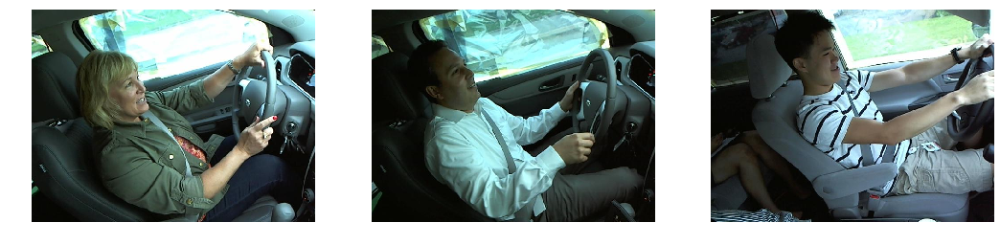

In [13]:
#클래스 c0에 속하는 잘못 분류된 데이터를 시각화하기
#Real Label:c0
imgs = [('c5', 30288), ('c7', 46617), ('c8', 3835)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c0 : 안전운전 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

#Examples of c1:오른손으로 문자 classified in wrong labels


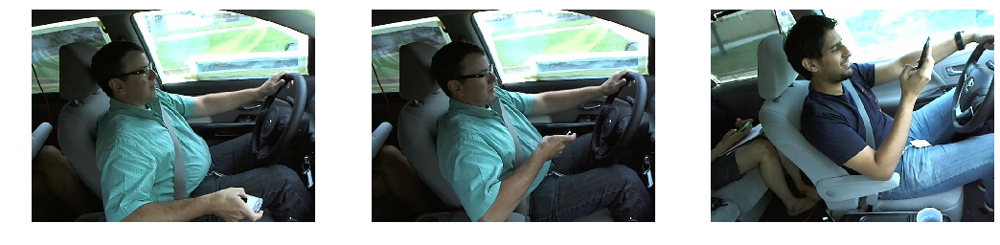

In [14]:
#클래스 c1에 속하는 잘못 분류된 데이터를 시각화하기
#Real Label:c1
imgs=[('c0',29923),('c0',79819),('c2',32934)]
f,ax=plt.subplots(figsize=(18,10))

print('#Examples of c1:오른손으로 문자 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1,3,x+1)
    image=read_image('{}train/{}/img_{}.jpg'.format(data_dir,imgs[x][0],imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

#Examples of c8:얼굴,머리 만지기 classified in wrong labels


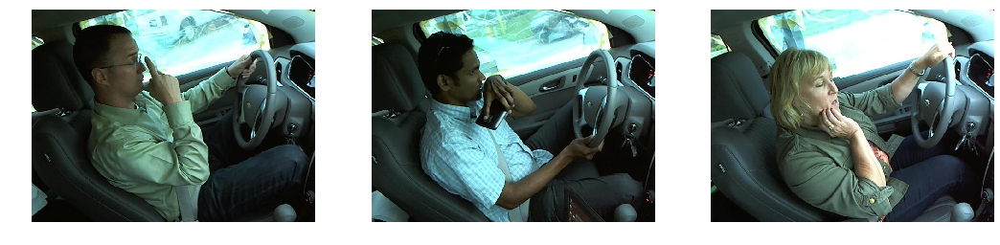

In [15]:
#클래스 c8에 속하는 잘못 분류된 데이터를 시각화하기
#Real Label:c8
imgs=[('c0',34380),('c3',423),('c5',78504)]
f,ax=plt.subplots(figsize=(18,10))

print('#Examples of c8:얼굴,머리 만지기 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1,3,x+1)
    image=read_image('{}train/{}/img_{}.jpg'.format(data_dir,imgs[x][0],imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

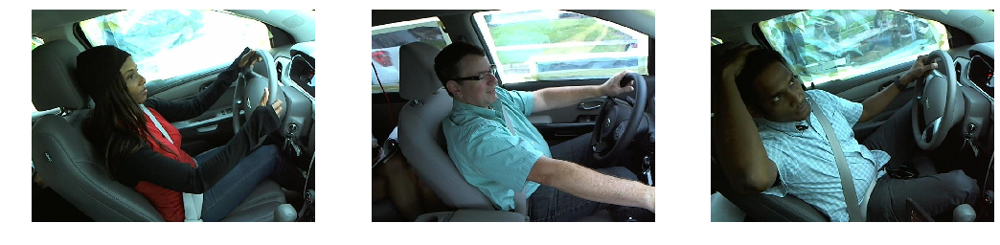

In [16]:
#데이터 어그멘테이션을 수행할 예시 이미지 3개의 원본을 시각화하기
#이미지 파일 경로를 지정한다
data_dir = 'C:/Users/juhee/.kaggle/competitions/state-farm-distracted-driver-detection/imgs/'
img_path=[('c0',55301),('c5',92551),('c8',71055)]

#이미지를 그대로 읽어온다
imgs=[]
for x in range(len(img_path)):
    imgs.append(read_image('{}train/{}/img_{}.jpg'.format(data_dir,img_path[x][0],img_path[x][1]))/255.)
    
#이미지를 시각화 한다
f,ax=plt.subplots(figsize=(18,10))
for i,img in enumerate(imgs):
    plt.subplot(1,3,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

# 이미지 회전 : 12도


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


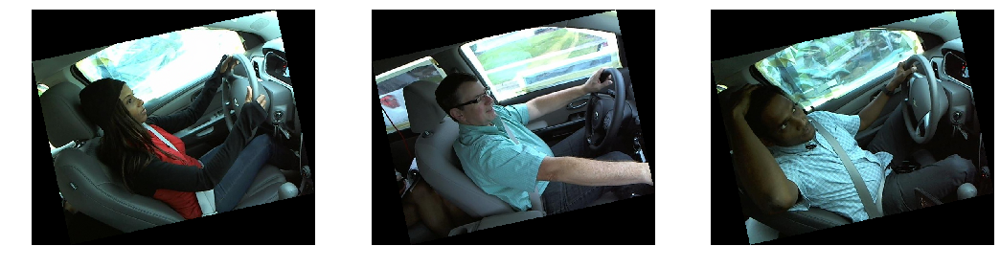

In [17]:
# #325임의의 회전 각도로 회전한 이미지를 시각화 하기
# from scipy.ndimage import rotate

# #임의의 회전 각도(rotate_angle) 을 구한 후, 이미지를 회전한다.
# rotate_angle=np.random.randint(40) -20
# print('#이미지 회전:{}도'.format(rotate_angle))

# for i,img in enumerate(imgs):
#     imgs[i]=rotate(img,rotate_angle)

# #이미지 시각화
# f,ax=plt.subplots(figsize=(18,10))
# for x,img in enumerate(imgs):
#     plt.subplot(1,3,i+1)
#     plt.imshow(img)
#     plt.axis('off')
# plt.show()
from scipy.ndimage import rotate


# 임의의 회전 각도(rotate_angle)을 구한 후, 이미지를 회전한다.
rotate_angle = np.random.randint(40) - 20
print('# 이미지 회전 : {}도'.format(rotate_angle))
for i, img in enumerate(imgs):
    imgs[i] = rotate(img, rotate_angle)

# 이미지를 시각화한다.
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


# 이미지 줌 인 : (x : 0.8, y : 0.97)


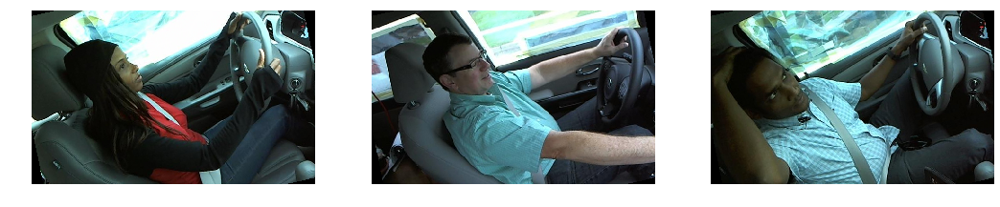

In [18]:
# def crop_center(img, cropx,cropy):
#     y,x =img.shape
#     startx =x//2 -(cropx//2)
#     starty =y//2 -(cropy//2)
#     return img[starty::starty+cropy,startx:startx+cropx]

# #x,y축의 이미지 확대 비율을 랜덤으로 정의한다

# width_zoom=int(image.shape[0]* (0.8 +0.2 *(1-np.random.random())))
# height_zoom=int(image.shape[1]*(0.8 +0.2 * (1-np.random.random())))

# #이미지를 확대한다
# print('#이미지확대:(x:{},y:{})'.format(round(1. * width_zoom / image.shape[0],2),round(1. *height_zoom/image.shape[1],2)))
# for i, img in enumerate(imgs):
#     final_image=np.zeros((width_zoom,height_zoom,3))
#     final_image[:,:,0]=crop_center(img[:,:,0],height_zoom,width_zoom)
#     final_image[:,:,1]=crop_center(img[:,:,1],height_zoom,width_zoom)
#     final_image[:,:,2]=crop_center(img[:,:,2],height_zoom,width_zoom)
#     imgs[i]=final_image
    
# #이미지를 시각화 한다
# f,ax =plt.subplots(figsize=(18,10))
# for x, img in enumerate(imgs):
#     plt.subplot(1,3,x+1)
#     plt.imshow(img)
#     plt.axis('off')
# plt.show()


def crop_center(img, cropx, cropy):
    # 이미지 중간을 Crop하는 함수를 정의한다
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

# x,y 축의 이미지 확대 비율을 랜덤으로 정의한다
width_zoom = int(image.shape[0] * (0.8 + 0.2 * (1 - np.random.random())))
height_zoom = int(image.shape[1] * (0.8 + 0.2 * (1 - np.random.random())))

# 이미지를 확대한다
print('# 이미지 줌 인 : (x : {}, y : {})'.format(round(1. * width_zoom / image.shape[0], 2), \
                                            round(1. *height_zoom / image.shape[1],2 )))
for i, img in enumerate(imgs):
    final_image = np.zeros((width_zoom, height_zoom, 3))
    final_image[:,:,0] = crop_center(img[:,:,0], height_zoom, width_zoom)
    final_image[:,:,1] = crop_center(img[:,:,1], height_zoom, width_zoom)
    final_image[:,:,2] = crop_center(img[:,:,2], height_zoom, width_zoom)
    imgs[i] = final_image

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10x10 커널 크기로 이미지 흐리기


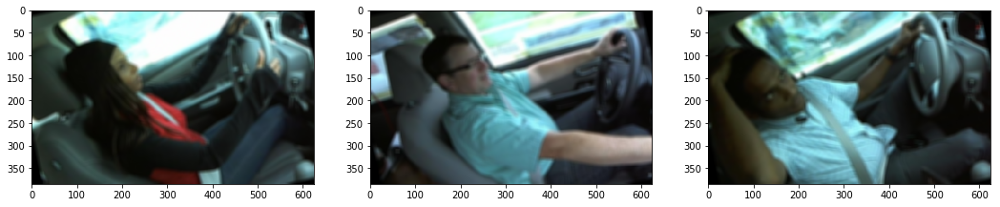

In [19]:
# 10x10 크기의 커널로 이미지를 흐린다
blur_degree = 10
print('{}x{} 커널 크기로 이미지 흐리기'.format(blur_degree, blur_degree))
for i, img in enumerate(imgs):
    imgs[i] = cv2.blur(img,(blur_degree,blur_degree))

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    #plt.axis('off')
plt.show()

In [1]:
#모델 정의
import keras
from keras.models import Model
from keras.layers.core import Dense,Dropout,Flatten
from keras.optimizers import SGD

#
img_row_size, img_col_size = 224, 224
def get_model():
    # 최상위 전결층을 제외한 모델을 불러온다
    
    base_model=keras.applications.vgg16.VGG16(include_top=False,weights=None,
                                             input_shape=(224,224,3))

#     if args.model in ['vgg16']:
#         base_model = keras.applications.vgg16.VGG16(include_top=False, weights=args.weights, input_shape=(img_row_size, img_col_size,3))
#     elif args.model in ['vgg19']:
#         base_model = keras.applications.vgg19.VGG19(include_top=False, weights=args.weights, input_shape=(img_row_size, img_col_size,3))
#     elif args.model in ['resnet50']:
#         base_model = keras.applications.resnet50.ResNet50(include_top=False, weights=args.weights, input_shape=(img_row_size, img_col_size,3))
#     else:
#         print('# {} is not a valid value for "--model"'.format(args.model))
#         exit()

    # 최상위 전결층을 정의한다
    out = Flatten()(base_model.output)
    out = Dense(2048, activation='relu')(out)
    out = Dropout(0.5)(out)
    out = Dense(2048, activation='relu')(out)
    out = Dropout(0.5)(out)
    output = Dense(10, activation='softmax')(out)
    model = Model(inputs=base_model.input, outputs=output)

    # SGD Optimizer를 사용하여, 모델을 compile한다
    sgd = SGD(lr=1e-4, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

Using TensorFlow backend.


In [3]:
#데이터 전처리

from keras.preprocessing.image import ImageDataGenerator

#이미지 데이터 전처리를 수행하는 함수를 정의한다
datagen=ImageDataGenerator()

train_generator=datagen.flow_from_directory(
    directory='C:/Users\juhee/.kaggle/competitions/state-farm-distracted-driver-detection/input/train2/',
    target_size=(224,224),
    batch_size=8,
    class_mode='categorical',
    seed=2018

)
valid_generator=datagen.flow_from_directory(
    directory='C:/Users\juhee/.kaggle/competitions/state-farm-distracted-driver-detection/input/valid2/',
    target_size=(224,224),
    batch_size=8,
    class_mode='categorical',
    seed=2018

)
test_generator=datagen.flow_from_directory(
    directory='C:/Users\juhee/.kaggle/competitions/state-farm-distracted-driver-detection/input/test2/',
    target_size=(224,224),
    batch_size=1,
    class_mode=None,
    shuffle=False

)

Found 18424 images belonging to 1 classes.
Found 4000 images belonging to 1 classes.
Found 79726 images belonging to 1 classes.


In [23]:
from glob import glob
import numpy as np
import subprocess
import os
nfolds = 5
labels = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']
train_path='C:\\Users\\juhee\\.kaggle\\competitions\\state-farm-distracted-driver-detection\\imgs\\train'
test_path='C:\\Users\\juhee\\.kaggle\\competitions\\state-farm-distracted-driver-detection\\imgs\\test2\\test'


nfolds = 5
labels = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']
n_class=10

def generate_split():
    def _generate_temp_folder(root_path):
        os.mkdir(root_path)
        print(root_path)
        for i in range(n_class):
            os.mkdir('{}/c{}'.format(root_path,i))
            path = ('{}/c{}'.format(root_path,i))
            print(path)
    _generate_temp_folder(temp_train_fold)
    _generate_temp_folder(temp_valid_fold)
    train_samples = 0
    valid_samples = 0
    for label in labels:
        files=glob('{}/{}/*jpg'.format(train_path,label))
        for fl in files:
                cmd='cp  {}/{} {}/{}/'
                if np.random.randint(nfolds)!=1:
                    cmd=cmd.format(fl,temp_train_fold,label,os.path.basename(fl))
                    train_samples += 1
                else:
                    cmd=cmd.format(fl,temp_valid_fold,label,os.path.basename(fl))
                    valid_samples += 1
                subprocess.call(cmd ,stderr=subprocess.STDOUT, shell=True)

    print('# {} train samples | {} valid samples'.format(train_samples, valid_samples))
    return train_samples, valid_samples

In [24]:
from keras.callbacks import EarlyStopping,ModelCheckpoint
import pandas as pd
import shutil

print('#Train Model')
datagen=ImageDataGenerator()
test_generator =datagen.flow_from_directory(
    test_path,
    target_size=(224,224),
    batch_size=1,
    class_mode=None,
    shuffle=False)
test_id=[os.path.basename(fl) for fl in glob('{}/imgs/*.jpg'.format(test_path))]

for fold in range(nfolds):
    model= get_model()
    
    train_samples ,valid_samples =generate_split()
    
    train_generator =datagen.flow_from_directory(
    directory=temp_train_fold,
    target_size=(224,224),
    batch_size=1,
    class_mode='categorical',
    seed=10)
    
    valid_generator =datagen.flow_from_directory(
    directory=temp_valid_fold,
    target_size=(224,224),
    batch_size=1,
    class_mode='categorical',
    seed=10)
    
#     weight_saver = ModelCheckpoint('5.h', monitor='val_loss',verbose=0,
#    callbacks = [EarlyStopping(monitor='val_loss', patience=3, verbose=0),
#     callbacks = [EarlyStopping(monitor='val_loss', patience=3, verbose=0),
#                   ModelCheckpoint('5.h', monitor='val_loss', save_best_only=True, verbose=0)]
    

#     model.fit_generator(
#         train_generator,
#         steps_per_epoch=20,
#         validation_data=valid_generator,
#         validation_steps=20,
#         shuffle=True,
#         callbacks=callbacks,
#         verbose=1
       
#     )
#     model.fit_generator(train_generator,steps_per_epoch=20,epochs=500,validation_data=valid_generator,validation_steps=20,shuffle=True,
#                        callbacks=callbacks,verbose=1)


#Train Model
Found 0 images belonging to 0 classes.


FileExistsError: [WinError 183] 파일이 이미 있으므로 만들 수 없습니다: 'C:/Users/juhee/.kaggle/competitions/state-farm-distracted-driver-detection/fold/temp_train_fold/'